 Reference: https://github.com/VidushiBhatia/U-Net-Implementation/blob/main/U_Net_for_Image_Segmentation_From_Scratch_Using_TensorFlow_v4.ipynb

In [1]:
import os
import random

import imageio
from PIL import Image

# for visualizations
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import numpy as np 

# for bulding and running deep learning model
import tensorflow as tf
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
from tensorflow.keras.losses import binary_crossentropy
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator

In [2]:
filePath = '/home/shared/DARPA/patched_data/patch_size_256_patch_overlap_0_legend_size_256/training/'

### Visualize the input data 

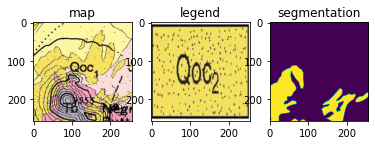

In [49]:
def plotter(map_img, label_img, seg_img):
    plt.subplot(1,3,1)
    plt.title("map")
    plt.imshow(map_img)

    plt.subplot(1,3,2)
    plt.title("legend")
    plt.imshow(label_img) 
    
    plt.subplot(1,3,3)
    plt.title("segmentation")
    plt.imshow(seg_img)

def plotMap(fileName):
    mapName = 'map_patches/'+fileName
    segName = 'seg_patches/'+fileName
    labelName = 'labels/'+fileName

    map_img = mpimg.imread(filePath+mapName)
    seg_img = mpimg.imread(filePath+segName)
    label_img = mpimg.imread(filePath+labelName)
    
    plotter(map_img, label_img, seg_img)

    
    
plotMap('CA_CougarButtes_Qoc2_poly_426.png')

## create a datagenerator 

In [45]:
def load_img(filename):
    mapName = 'map_patches/'+filename
    legendName = 'labels/'+filename    
    
    map_img = tf.io.read_file(filePath+mapName) # Read image file
    map_img = tf.cast(tf.io.decode_png(map_img), dtype=tf.float32) / 255.0
    
    legend_img = tf.io.read_file(filePath+legendName) # Read image file
    legend_img = tf.cast(tf.io.decode_png(legend_img), dtype=tf.float32) / 255.0

    img = tf.concat(axis=2, values = [map_img, legend_img])
    img = img*2.0 - 1.0 # range(-1.0,1.0)
    resize_image = tf.image.resize(img, [256, 256])
    
    segName = 'seg_patches/'+filename
    seg = tf.io.read_file(filePath+segName) # Read image file
    seg = tf.io.decode_png(seg)/255
    resize_seg = tf.image.resize(seg, [256, 256])
    
    # Random up/down & left/right pixel shifts, 90 degree rotations
#     npix = 32
#     h = np.random.randint(-npix, npix + 1, 1)[0]  # Horizontal shift
#     v = np.random.randint(-npix, npix + 1, 1)[0]   # Vertical shift
#     r = np.random.randint(0, 4, 1)[0]              # 90 degree rotations
    
#     L, W = resize_image.shape
#     resize_image = np.pad(resize_image, ((npix, npix), (npix, npix)), 'constant')[npix + h:L + h + npix,
#                                    npix + v:W + v + npix]
#     resize_seg = np.pad(resize_seg, ((npix, npix), (npix, npix)), 'constant')[(pix + h):(L+ h + npix),
#                                    npix + v:W + v + npix]
#     resize_image, resize_seg = np.rot90(resize_image, r), np.rot90(resize_seg, r)
    
    return resize_image, resize_seg

In [46]:
def patch_img(filename1, filename2):
    mapName = 'map_patches/'+filename1
    legendName = 'labels/'+filename2    
    
    map_img = tf.io.read_file(filePath+mapName) # Read image file
    map_img = tf.cast(tf.io.decode_png(map_img), dtype=tf.float32) / 255.0
    
    legend_img = tf.io.read_file(filePath+legendName) # Read image file
    legend_img = tf.cast(tf.io.decode_png(legend_img), dtype=tf.float32) / 255.0

    img = tf.concat(axis=2, values = [map_img, legend_img])
    img = img*2.0 - 1.0 # range(-1.0,1.0)
    resize_image = tf.image.resize(img, [256, 256])
    
    segName = 'seg_patches/'+filename1
    seg = tf.io.read_file(filePath+segName) # Read image file
    seg = tf.io.decode_png(seg)/255
    resize_seg = tf.image.resize(seg, [256, 256])*0.
    
    return resize_image, resize_seg

In [41]:
img, seg = load_img('CA_CougarButtes_Qoc2_poly_426.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


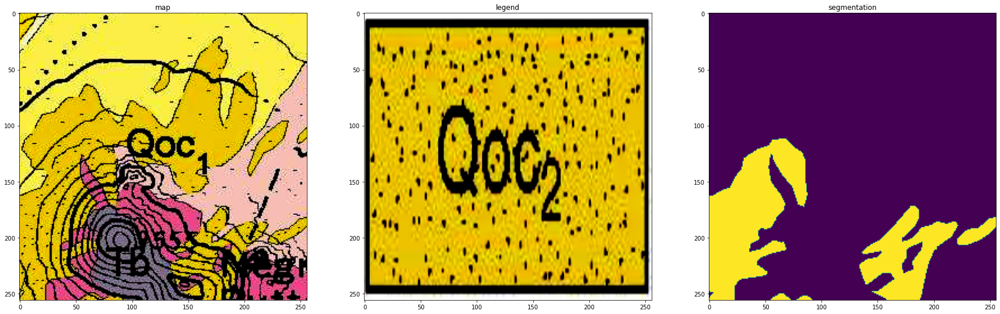

In [56]:
plt.figure(figsize=(30,10))
plotter(img[:,:,:3], img[:,:,3:], seg)

In [51]:
img2, seg2 = load_img('CA_CougarButtes_Qoc1_poly_1081.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


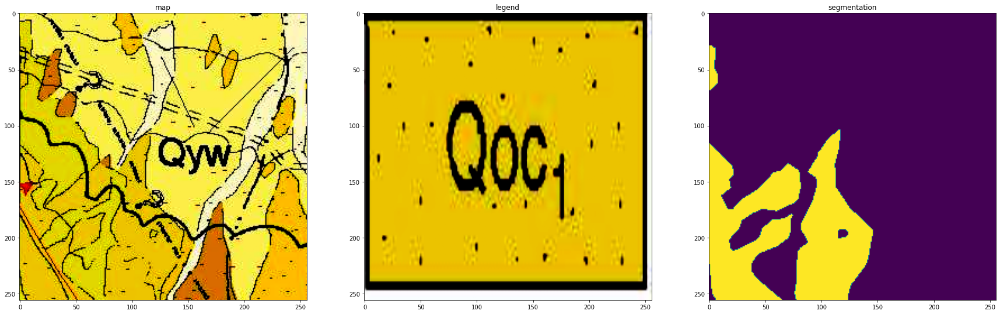

In [55]:
plt.figure(figsize=(30,10))
plotter(img2[:,:,:3], img2[:,:,3:], seg2)

In [47]:
new_img, new_seg = patch_img('CA_CougarButtes_Qoc1_poly_1081.png', 'CA_CougarButtes_Qoc2_poly_426.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


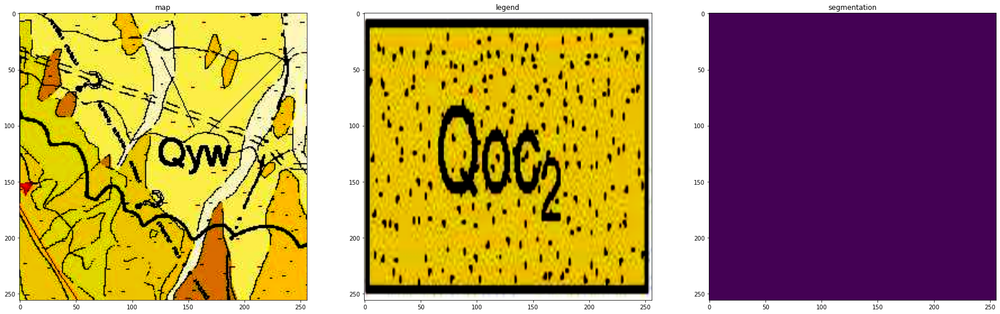

In [54]:
plt.figure(figsize=(30,10))
plotter(new_img[:,:,:3], new_img[:,:,3:], new_seg)

In [71]:
filenames = [f for f in os.listdir(filePath+'map_patches') if '_poly_' in f]

In [72]:
len(filenames)

235693

In [73]:
all_files = os.listdir(filePath+'map_patches')
len(all_files)

276549

In [74]:
train_file, validate_file = train_test_split(filenames, train_size=0.8, random_state=42)
len(train_file), len(validate_file), len(filenames)

train_dataset = tf.data.Dataset.from_tensor_slices(train_file)
train_dataset = train_dataset.map(load_img)
train_dataset = train_dataset.shuffle(500).batch(80)

# A peek of how BatchDataset 
# it = iter(train_dataset)
# print(next(it))

validate_dataset = tf.data.Dataset.from_tensor_slices(validate_file)
validate_dataset = validate_dataset.map(load_img)
validate_dataset = validate_dataset.shuffle(100).batch(10)

## Constructing the U-Net Architecture

### U-Net Encoder Block

In [75]:
def EncoderMiniBlock(inputs, n_filters=32, dropout_prob=0.3, max_pooling=True):
    """
    This block uses multiple convolution layers, max pool, relu activation to create an architecture for learning. 
    Dropout can be added for regularization to prevent overfitting. 
    The block returns the activation values for next layer along with a skip connection which will be used in the decoder
    """
    conv = Conv2D(n_filters, 
                  3,   # Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(inputs)
    conv = Conv2D(n_filters, 
                  3,   # Kernel size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(conv)
    
    # Batch Normalization will normalize the output of the last layer based on the batch's mean and standard deviation
    conv = BatchNormalization()(conv, training=False)

    # In case of overfitting, dropout will regularize the loss and gradient computation to shrink the influence of weights on output
    if dropout_prob > 0:     
        conv = tf.keras.layers.Dropout(dropout_prob)(conv)

    if max_pooling:
        next_layer = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(conv)    
    else:
        next_layer = conv

    # skip connection (without max pooling) will be input to the decoder layer to prevent information loss during transpose convolutions      
    skip_connection = conv
    
    return next_layer, skip_connection

### U-Net Decoder Block

In [76]:
def DecoderMiniBlock(prev_layer_input, skip_layer_input, n_filters=32):
    """
    Decoder Block first uses transpose convolution to upscale the image to a bigger size and then,
    merges the result with skip layer results from encoder block
    Adding 2 convolutions with 'same' padding helps further increase the depth of the network for better predictions
    The function returns the decoded layer output
    """
    # Start with a transpose convolution layer to first increase the size of the image
    up = Conv2DTranspose(
                 n_filters,
                 (3,3),    # Kernel size
                 strides=(2,2),
                 padding='same')(prev_layer_input)

    # Merge the skip connection from previous block to prevent information loss
    merge = concatenate([up, skip_layer_input], axis=3)
    
    # Add 2 Conv Layers with relu activation and HeNormal initialization for further processing
    # The parameters for the function are similar to encoder
    conv = Conv2D(n_filters, 
                 3,     # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(merge)
    conv = Conv2D(n_filters,
                 3,   # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(conv)
    return conv

### Compile U-Net Blocks

In [77]:
def UNetCompiled(input_size=(256, 256, 6), n_filters=32, n_classes=1):
    """
       Combine both encoder and decoder blocks according to the U-Net research paper
       Return the model as output 
    """
    # Input size represent the size of 1 image (the size used for pre-processing) 
    inputs = Input(input_size)
    
    # Encoder includes multiple convolutional mini blocks with different maxpooling, dropout and filter parameters
    # Observe that the filters are increasing as we go deeper into the network which will increasse the # channels of the image 
    cblock1 = EncoderMiniBlock(inputs, n_filters,dropout_prob=0, max_pooling=True)
    cblock2 = EncoderMiniBlock(cblock1[0],n_filters*2,dropout_prob=0, max_pooling=True)
    cblock3 = EncoderMiniBlock(cblock2[0], n_filters*4,dropout_prob=0, max_pooling=True)
    cblock4 = EncoderMiniBlock(cblock3[0], n_filters*8,dropout_prob=0.3, max_pooling=True)
    cblock5 = EncoderMiniBlock(cblock4[0], n_filters*16, dropout_prob=0.3, max_pooling=False) 
    
    # Decoder includes multiple mini blocks with decreasing number of filters
    # Observe the skip connections from the encoder are given as input to the decoder
    # Recall the 2nd output of encoder block was skip connection, hence cblockn[1] is used
    ublock6 = DecoderMiniBlock(cblock5[0], cblock4[1],  n_filters * 8)
    ublock7 = DecoderMiniBlock(ublock6, cblock3[1],  n_filters * 4)
    ublock8 = DecoderMiniBlock(ublock7, cblock2[1],  n_filters * 2)
    ublock9 = DecoderMiniBlock(ublock8, cblock1[1],  n_filters)

    # Complete the model with 1 3x3 convolution layer (Same as the prev Conv Layers)
    # Followed by a 1x1 Conv layer to get the image to the desired size. 
    # Observe the number of channels will be equal to number of output classes
    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(ublock9)

    conv10 = Conv2D(n_classes, 1, padding='same', activation="sigmoid")(conv9)
    
    # Define the model
    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

In [170]:
# Call the helper function for defining the layers for the model, given the input image size
unet = UNetCompiled(input_size=(256,256,6), n_filters=16, n_classes=1)

### Compile and Run Model

In [171]:
unet.compile(optimizer=tf.keras.optimizers.Adam(), 
             loss=tf.keras.losses.binary_crossentropy, #SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy', 'acc'])

In [172]:
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='my_saved_model/best_model.hdf5', 
    monitor='loss',
    verbose=1, 
    save_best_only=True,
    save_freq= 500)

In [173]:
# load weights
unet.load_weights("./my_saved_model/best_model.hdf5")

# Run the model in a mini-batch fashion and compute the progress for each epoch
results = unet.fit(train_dataset, epochs=2, callbacks=[cp_callback], validation_data=validate_dataset)

Epoch 1/2
 499/2357 [=====>........................] - ETA: 26:18 - loss: 0.0987 - accuracy: 0.9634 - acc: 0.9634
Epoch 1: loss improved from inf to 0.09858, saving model to my_saved_model/best_model.hdf5
 999/2357 [===========>..................] - ETA: 19:12 - loss: 0.0960 - accuracy: 0.9644 - acc: 0.9644
Epoch 1: loss improved from 0.09858 to 0.09601, saving model to my_saved_model/best_model.hdf5
1499/2357 [==================>...........] - ETA: 12:13 - loss: 0.0951 - accuracy: 0.9650 - acc: 0.9650
Epoch 1: loss improved from 0.09601 to 0.09507, saving model to my_saved_model/best_model.hdf5
1999/2357 [========================>.....] - ETA: 5:04 - loss: 0.0934 - accuracy: 0.9656 - acc: 0.9656
Epoch 1: loss improved from 0.09507 to 0.09343, saving model to my_saved_model/best_model.hdf5
2357/2357 [==============================] - 2386s 1s/step - loss: 0.0928 - accuracy: 0.9658 - acc: 0.9658 - val_loss: 0.0992 - val_accuracy: 0.9643 - val_acc: 0.9643
Epoch 2/2
 142/2357 [>..........

In [174]:
# serialize and save the model that you just trained 
saved_model_path = "./my_saved_model/my_model.h5" 
unet.save(saved_model_path)

## Evaluate Model Results

### Bias Variance Check

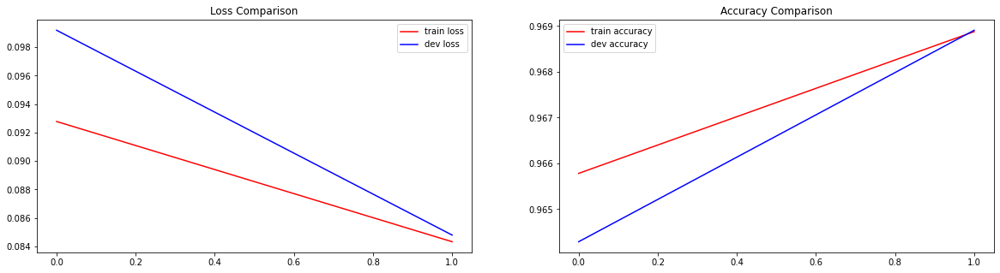

In [175]:
fig, axis = plt.subplots(1, 2, figsize=(20, 5))
axis[0].plot(results.history["loss"], color='r', label = 'train loss')
axis[0].plot(results.history["val_loss"], color='b', label = 'dev loss')
axis[0].set_title('Loss Comparison')
axis[0].legend()
axis[1].plot(results.history["accuracy"], color='r', label = 'train accuracy')
axis[1].plot(results.history["val_accuracy"], color='b', label = 'dev accuracy')
axis[1].set_title('Accuracy Comparison')
axis[1].legend()
plt.show()

### View Predicted Segmentations

In [176]:
unet.load_weights("./my_saved_model/best_model.hdf5")

In [177]:
def f_score_calculator(mat_true, mat_pred):
    overlap=mat_true*mat_pred
    num_overlap=len(np.argwhere(overlap==1))
#     print('num_overlap:', num_overlap)
    num_mat_pred=len(np.argwhere(mat_pred==1))
#     print('num_mat_pred:', num_mat_pred)
    num_mat_true=len(np.argwhere(mat_true==1))
#     print('num_mat_true:', num_mat_true)
    precision=num_overlap/(num_mat_pred+1) #avoid divide by zero! NOT AVAILABLE IN ACTUAL metric
    recall=num_overlap/(num_mat_true+1) #avoid divide by zero! NOT AVAILABLE IN ACTUAL metric


    # calculate f-score
    if precision+recall!=0:
        f_score=(2 * precision * recall) / (precision + recall)
    else:
        f_score=0
        
    return precision, recall, f_score

In [178]:
def plotResult(n, fileName):
    test_dataset = tf.data.Dataset.from_tensor_slices([fileName])
    test_dataset = test_dataset.map(load_img)
    test_dataset = test_dataset.batch(1)

    predicted = unet.predict(test_dataset)
    predicted[predicted >= 0.5] = 1
    predicted[predicted < 0.5] = 0
    mapName = 'map_patches/'+fileName
    segName = 'seg_patches/'+fileName

    map_img = mpimg.imread(filePath+mapName)
    seg_img = mpimg.imread(filePath+segName)
    
    # precision, recall, f_score = f_score_calculator(predicted[0,:,:,:], map_img)
    
    labelName = 'labels/'+fileName
    label_img = mpimg.imread(filePath+labelName)
    
    plt.rcParams["figure.figsize"] = (25,10)
    
    if fileName.split('.')[0].split('_')[-2]=='poly':
        plt.subplot(n,5,1)
        plt.title("map")
        plt.imshow(map_img)

        plt.subplot(n,5,2)
        plt.title("legend")
        plt.imshow(label_img)

        plt.subplot(n,5,3)
        plt.title("true segmentation")
        plt.imshow(seg_img, cmap='gray') 

        plt.subplot(n,5,4)
        plt.title("predicted segmentation")
        plt.imshow(predicted[0,:,:,:], cmap='gray') 

        plt.subplot(n,5,5)
        plt.title("error")
        plt.imshow(predicted[0,:,:,0]-seg_img) 
        plt.show()
        
    elif fileName.split('.')[0].split('_')[-2]=='pt':
        plt.subplot(n,5,1)
        plt.title("map")
        plt.imshow(map_img)

        plt.subplot(n,5,2)
        plt.title("legend")
        plt.imshow(label_img)

        plt.subplot(n,5,3)
        plt.title("true segmentation")
        plt.spy(seg_img, markersize=5) 

        plt.subplot(n,5,4)
        plt.title("predicted segmentation")
        predicted[predicted >= 0.5] = 1
        predicted[predicted < 0.5] = 0
        plt.spy(predicted[0,:,:,0], markersize=5) 

        plt.subplot(n,5,5)
        plt.title("error")
        plt.spy(predicted[0,:,:,0]-seg_img, markersize=5) 
        plt.show()
        
    #return [precision, recall, f_score]
    

In [179]:
def getMetric(fileName):
    test_dataset = tf.data.Dataset.from_tensor_slices([fileName])
    test_dataset = test_dataset.map(load_img)
    test_dataset = test_dataset.batch(1)

    predicted = unet.predict(test_dataset)
    predicted[predicted >= 0.5] = 1
    predicted[predicted < 0.5] = 0
    mapName = 'map_patches/'+fileName
    segName = 'seg_patches/'+fileName

    map_img = mpimg.imread(filePath+mapName)
    seg_img = mpimg.imread(filePath+segName)
    
    precision, recall, f_score = f_score_calculator(seg_img, predicted[0,:,:,0])
    
    return [precision, recall, f_score]

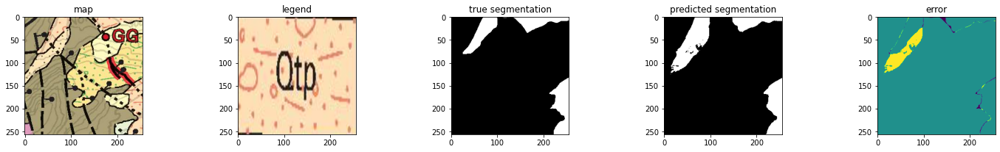

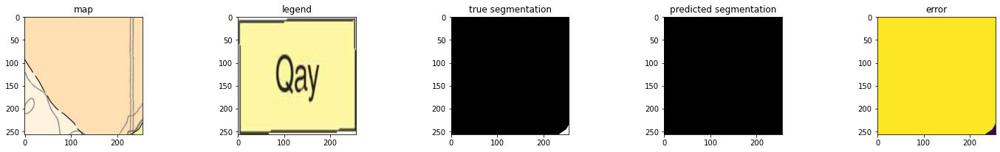

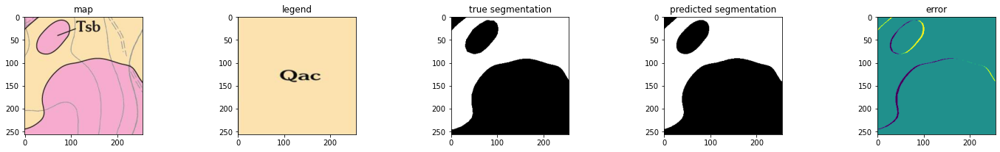

In [180]:
n=3
for fileName in random.sample(validate_file, n):
    plotResult(n, fileName)

CO_Frisco_Xhpg_poly_2294.png


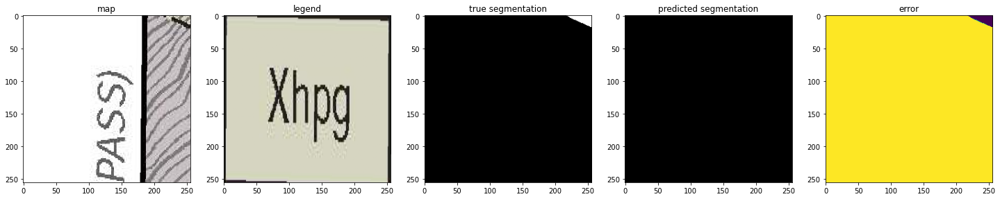

CA_Dubakella_Qal_poly_568.png


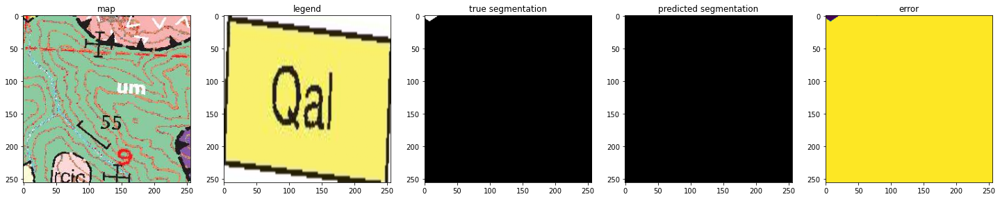

MT_Kalispell_Ysn_poly_292.png


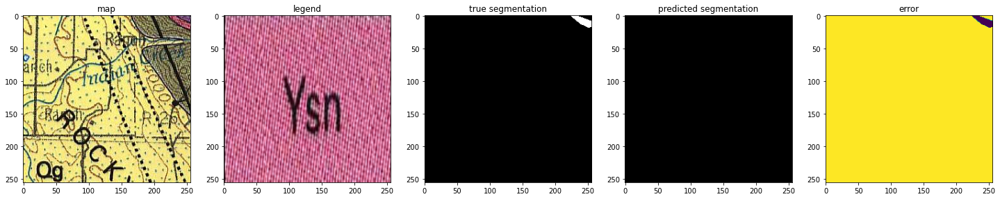

NV_AZ_BlackCanyon_Qc_poly_1159.png


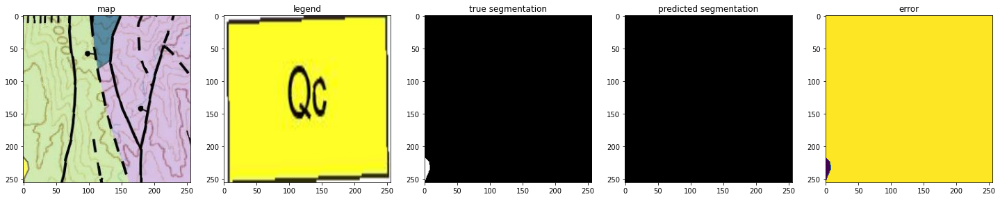

CA_SanJose_Tvs_poly_795.png


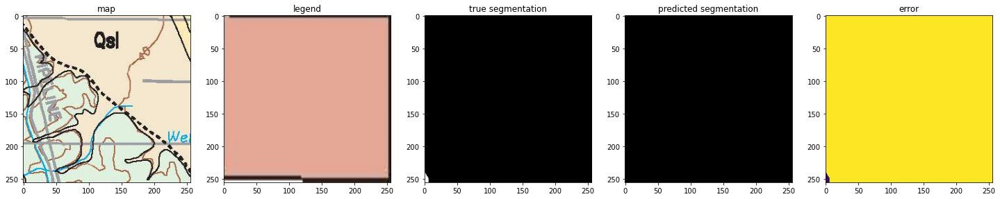

CA_Cambria_Jo_poly_1251.png


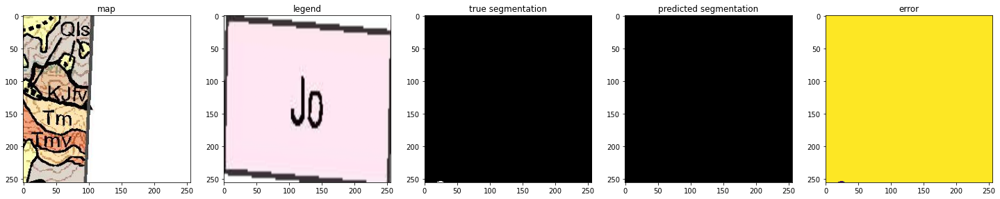

AZ_Fredonia_Qaf_poly_407.png


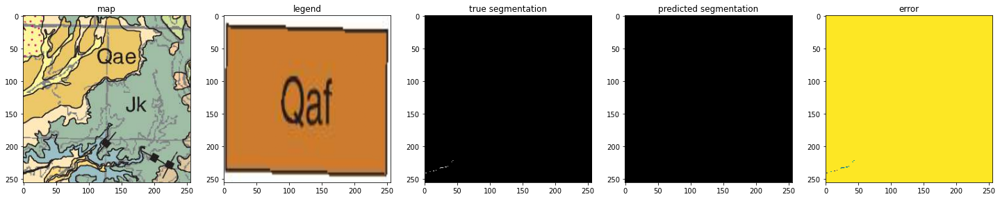

CO_Fraser_Qsa_poly_461.png


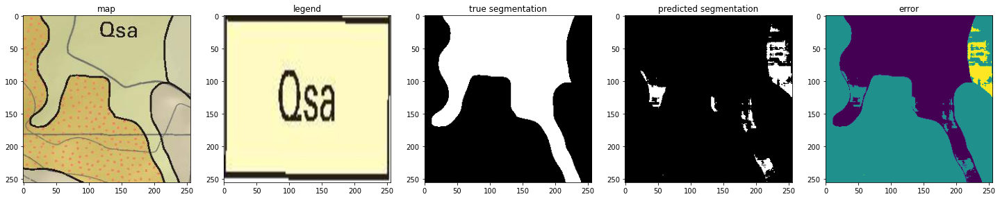

CA_Cambria_Kif_poly_475.png


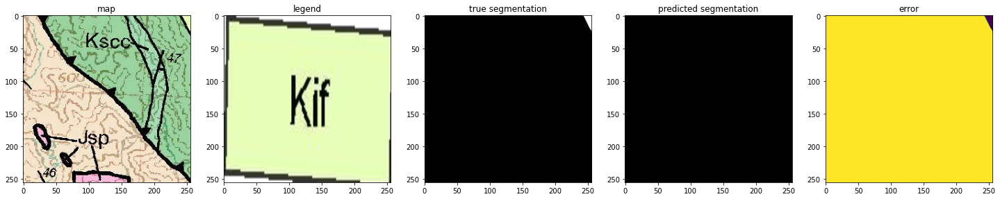

CA_Weaverville_ls_poly_1163.png


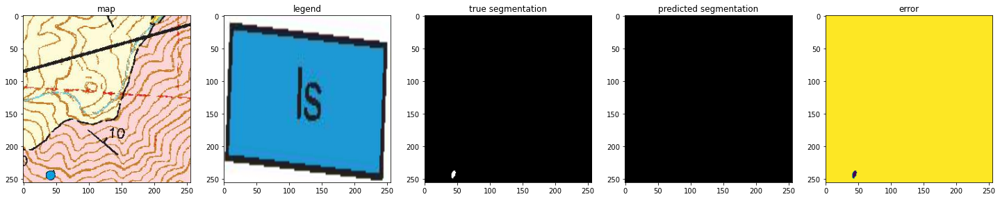

CO_HarvardLakes_Qtb_poly_636.png


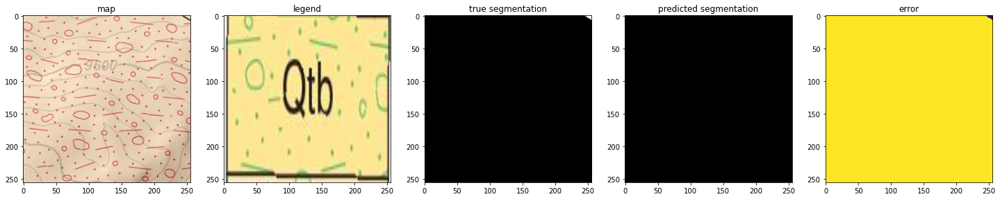

MA_Nashua_outcrops_poly_37.png


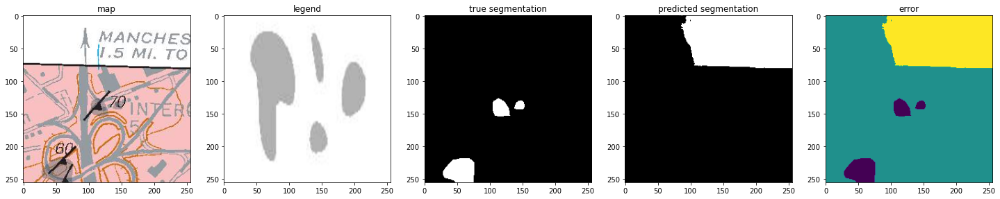

CO_BigCostilla_Xqct_poly_2205.png


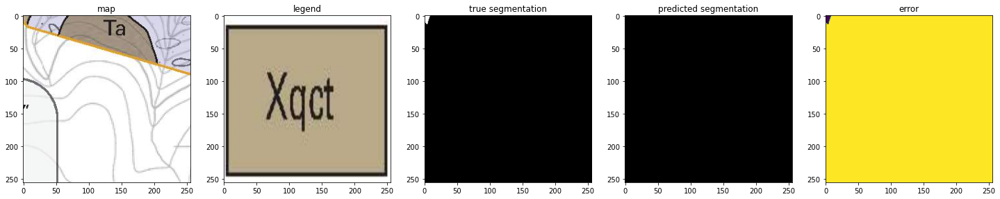

CO_Bailey_PIPf_poly_1662.png


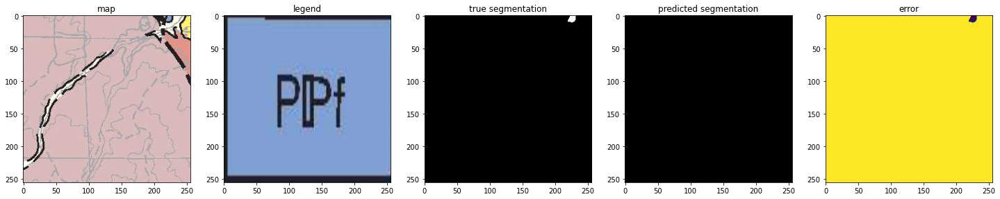

MA_Nashua_outcrops_poly_860.png


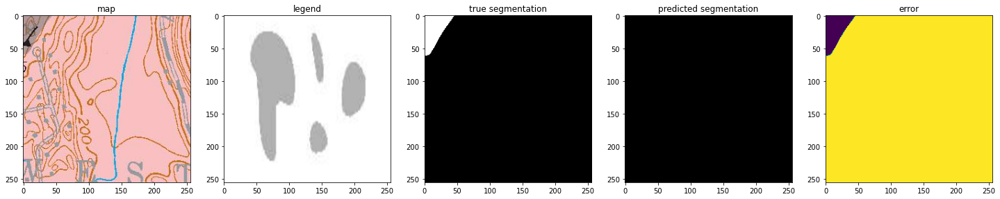

CO_Fraser_NPet_poly_527.png


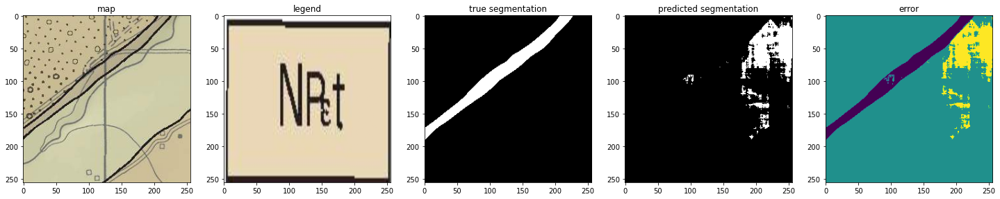

CA_Dubakella_um_poly_615.png


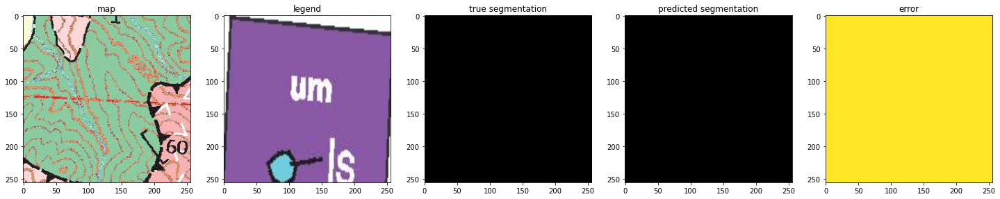

CA_Redding_ctss_poly_704.png


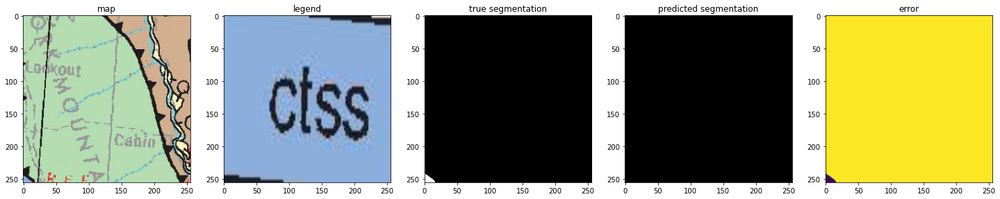

CA_Weaverville_Tw_poly_1168.png


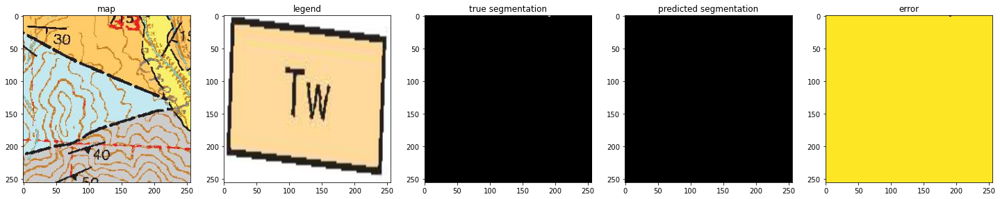

AK_Umiat_TKpc_poly_488.png


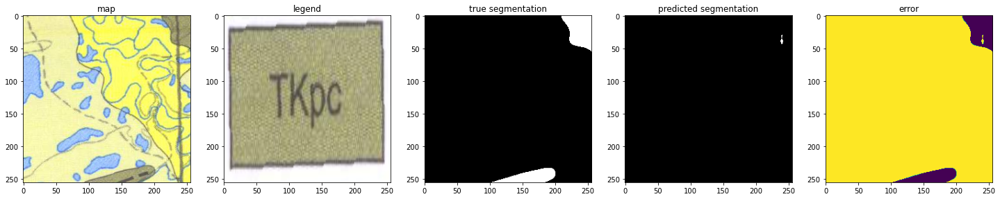

CO_Granite_pt_poly_733.png


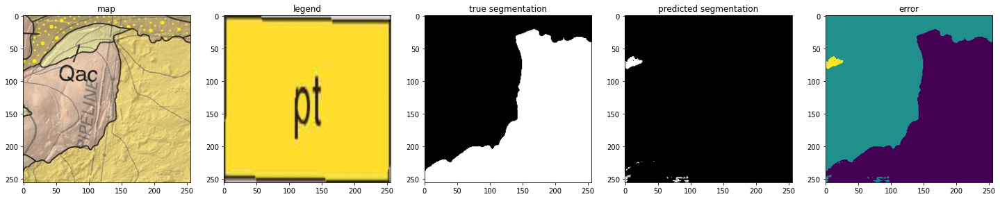

MA_Nashua_outcrops_poly_516.png


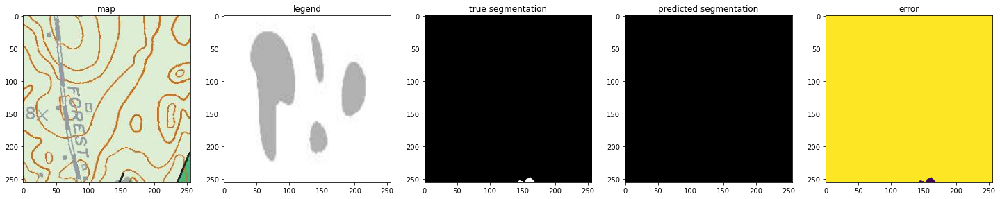

AZ_Littlefield_Ptw_poly_875.png


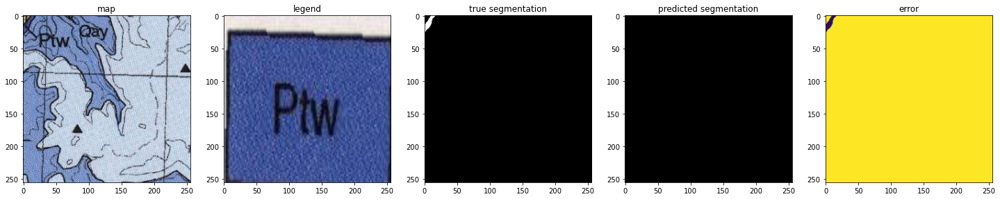

AZ_Littlefield_Ti_poly_746.png


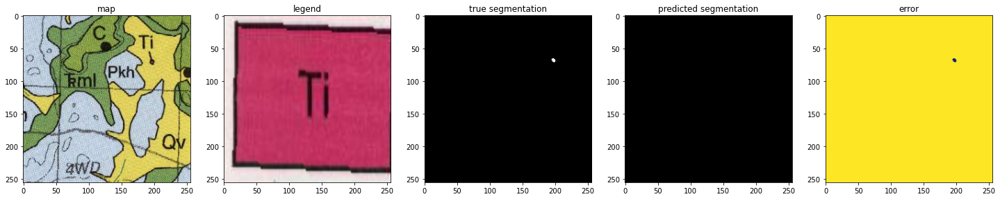

AZ_Flagstaff_Qa1_poly_699.png


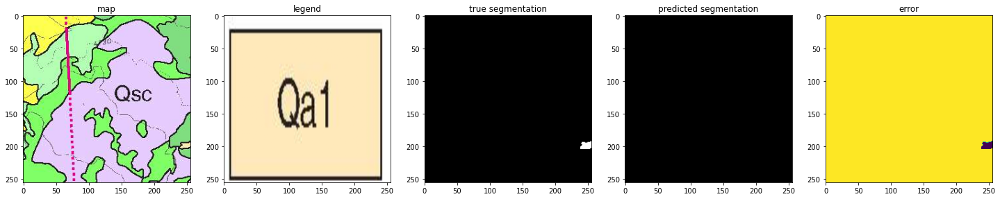

AZ_Littlefield_Ti_poly_568.png


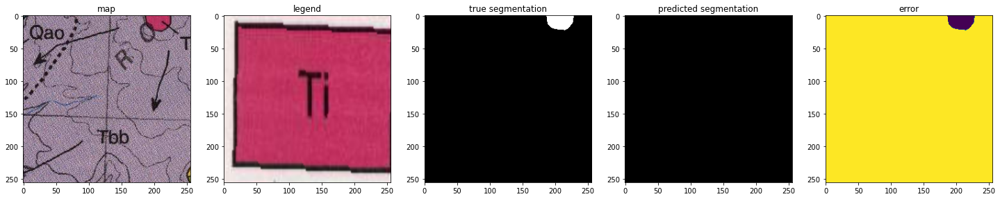

ID_Pullman_Tcs_poly_707.png


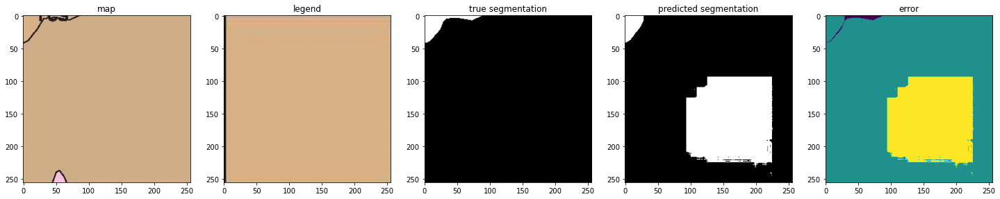

MT_Sedan_Qal_poly_1013.png


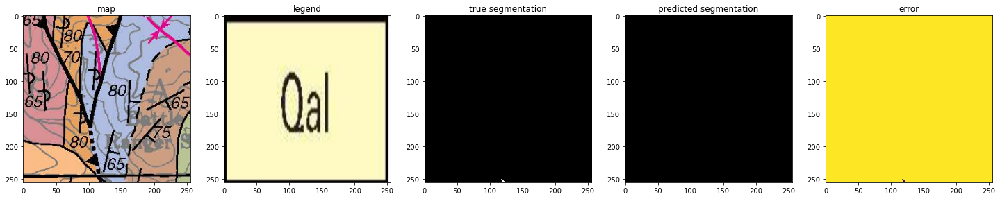

CA_Cambria_KJfg_poly_1194.png


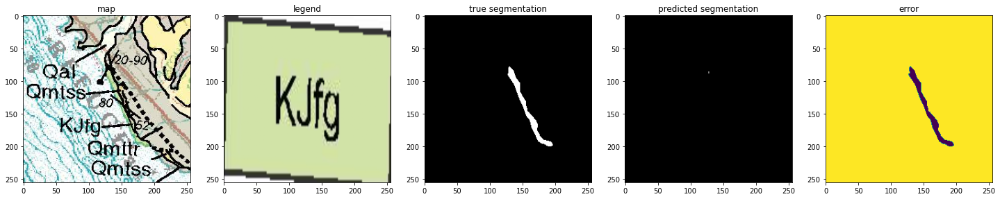

MT_Sedan_Mlp_poly_1277.png


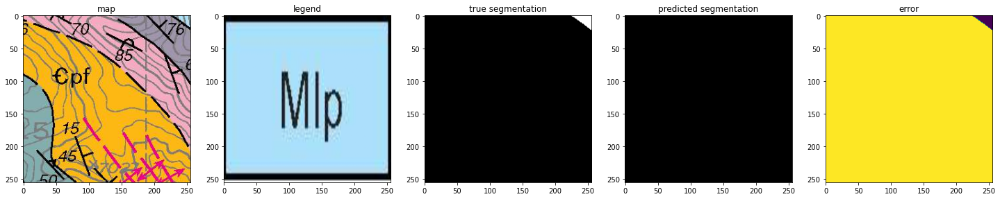

AK_Christian_Qgs_poly_1262.png


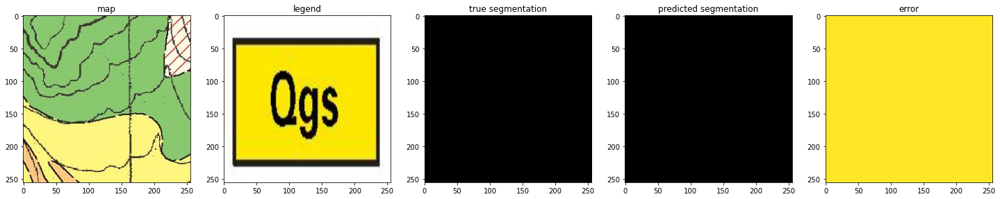

CA_InyoMtns_Qa_poly_1404.png


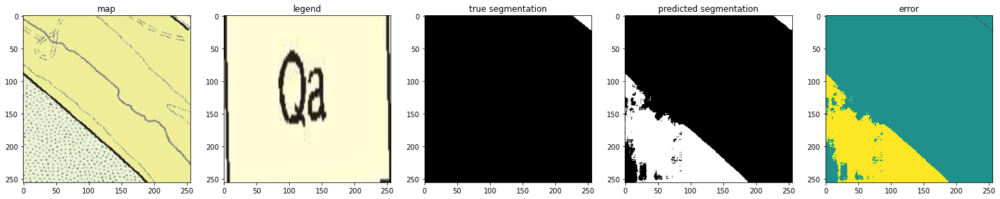

MT_Sedan_Tfu_poly_886.png


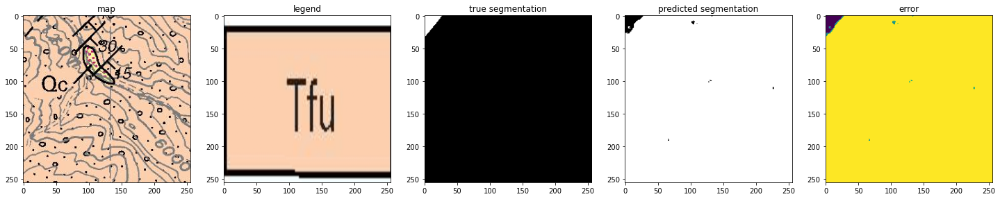

AZ_SatanButte_Qd2_poly_415.png


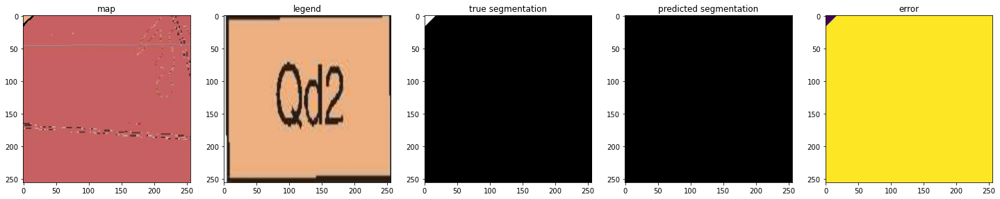

CA_SantaMaria_Tr_poly_1714.png


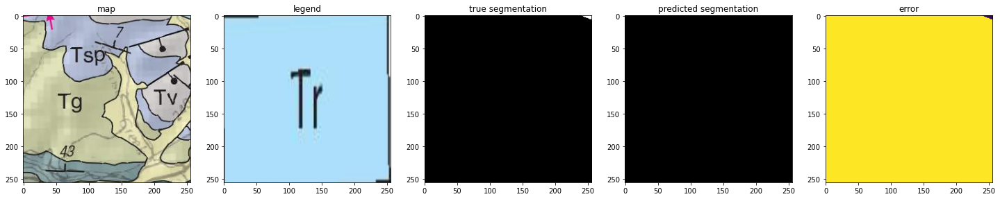

CA_Redding_Kqd_poly_479.png


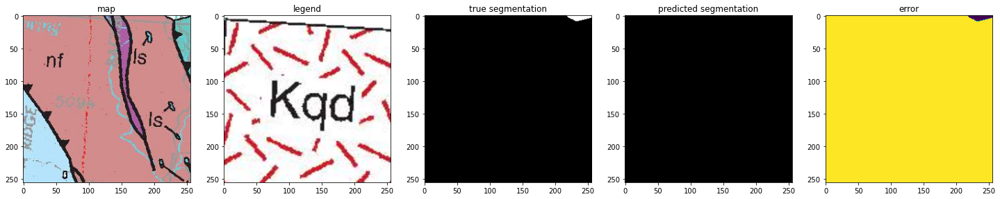

AZ_Littlefield_Qs_poly_243.png


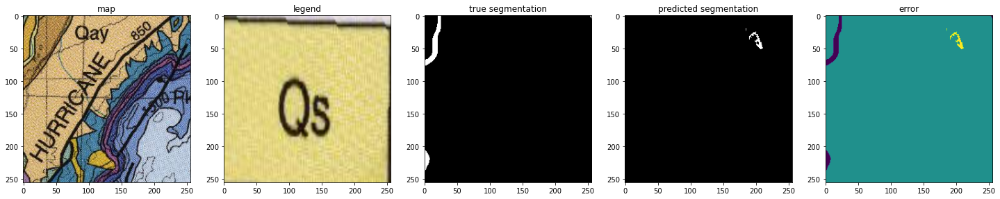

CA_CougarButtes_Qysws2_poly_310.png


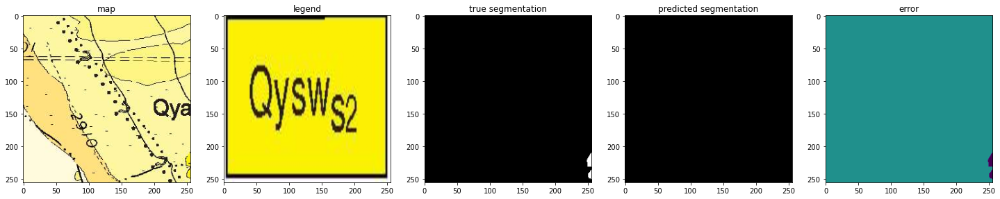

OK_250K_IPbd_poly_775.png


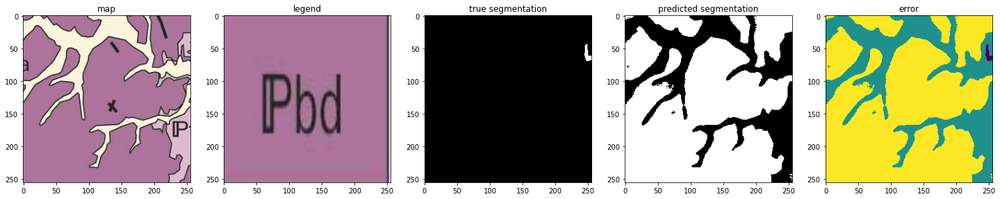

AZ_Littlefield_Qay_poly_1183.png


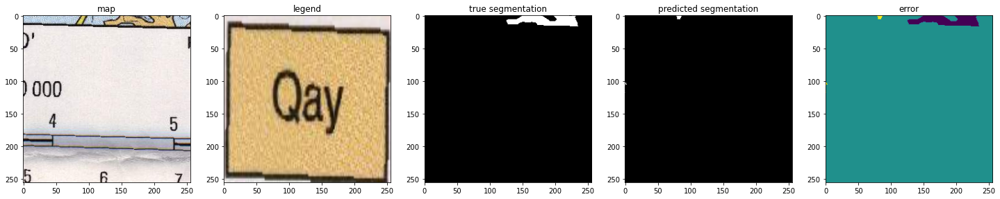

AR_Jasper_Mbs_poly_413.png


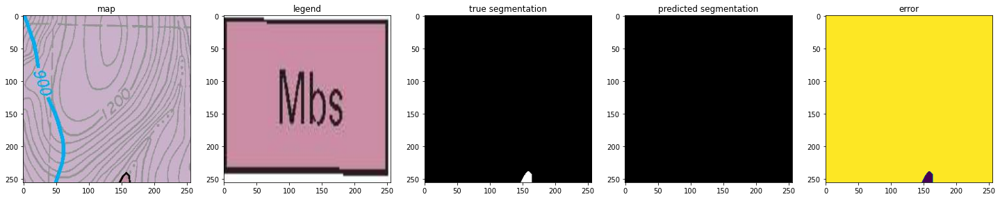

CO_Fraser_Qva_poly_447.png


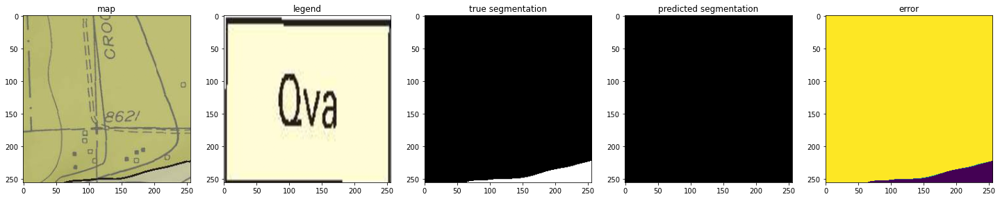

CO_PagosaSprings_Qpg_poly_289.png


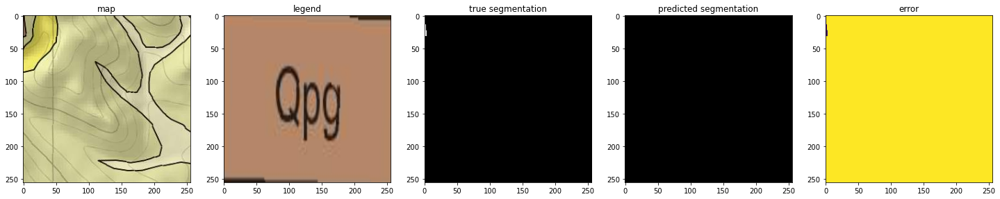

CA_SantaMaria_Tcd_poly_1649.png


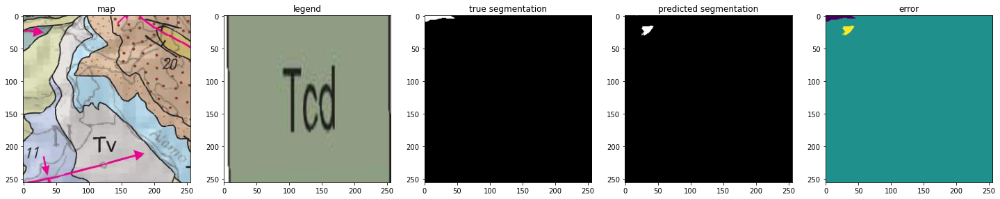

AZ_Fredonia_Qs_poly_711.png


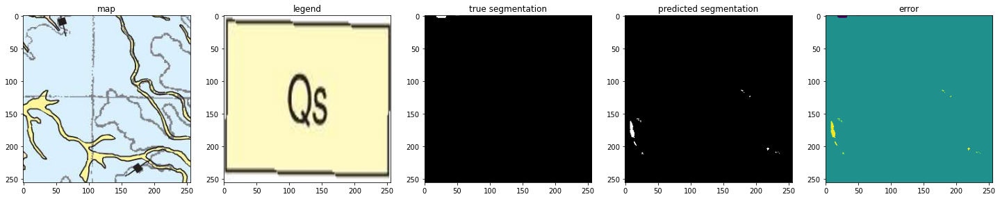

CA_WhiteLedgePeak_Tspm_poly_947.png


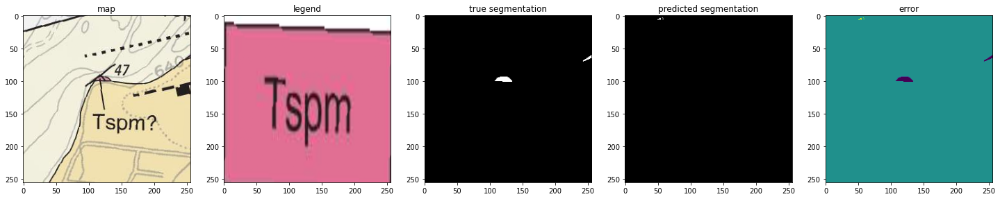

AK_McCarthy_KJs_poly_802.png


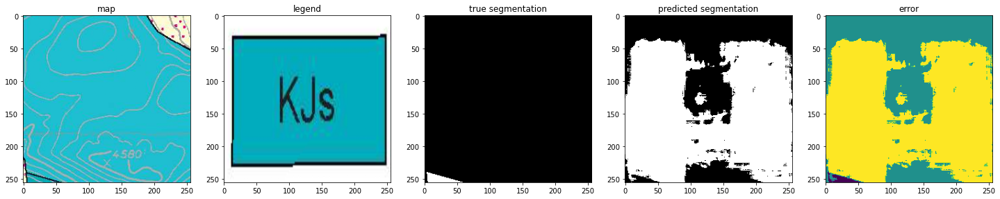

AZ_CA_Topock_Tao_poly_516.png


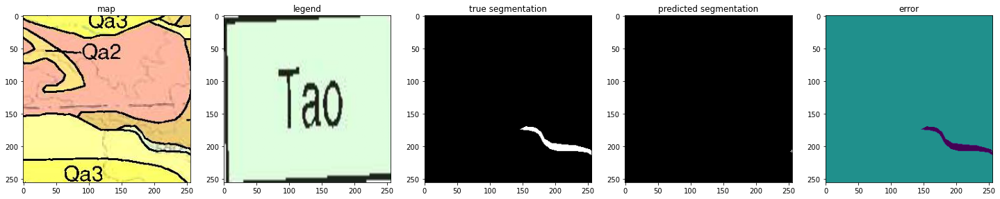

AZ_Flagstaff_Qg1_poly_2458.png


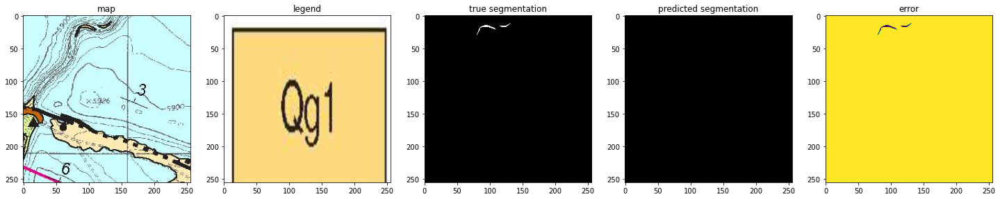

NM_CO_SanAntonio_Tca_poly_261.png


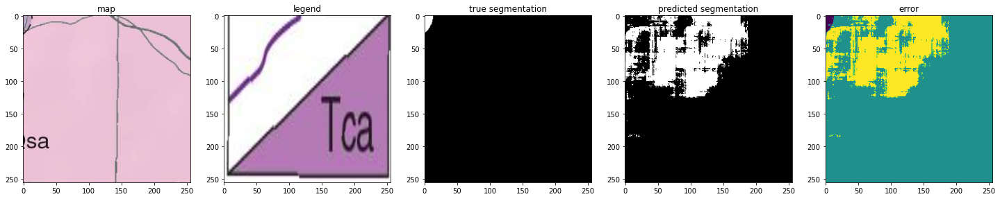

OK_250K_Pbi_poly_1413.png


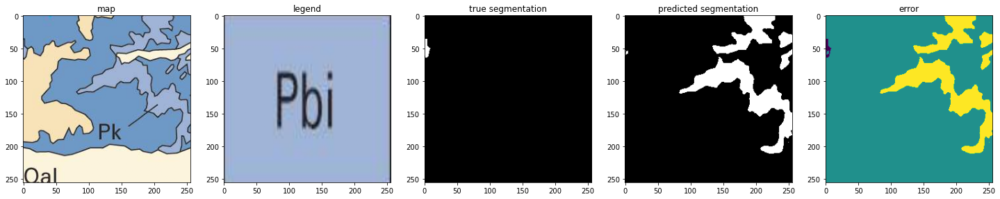

NV_AZ_BlackCanyon_Tim_poly_491.png


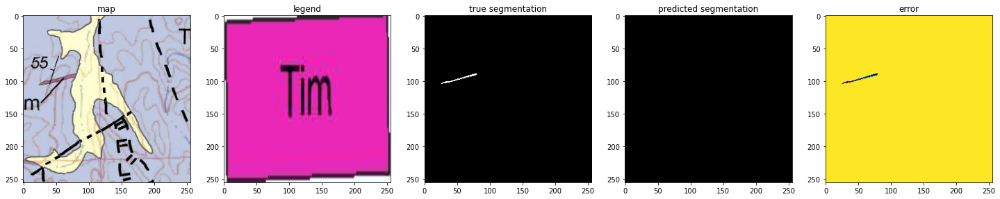

AR_Buffalo_west_Mb_poly_3650.png


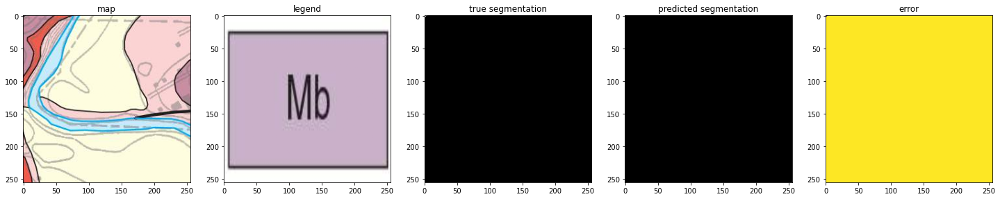

AZ_PeachSprings_Dtb_poly_1015.png


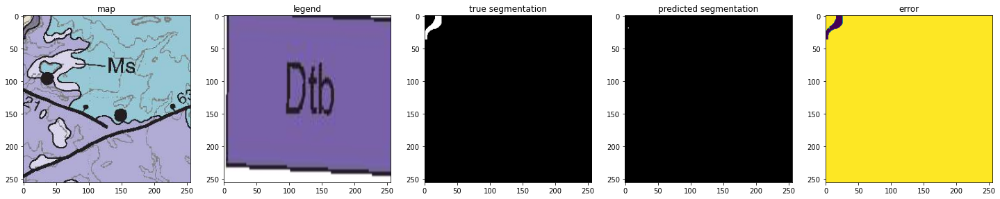

CA_Julian_Jhc_poly_247.png


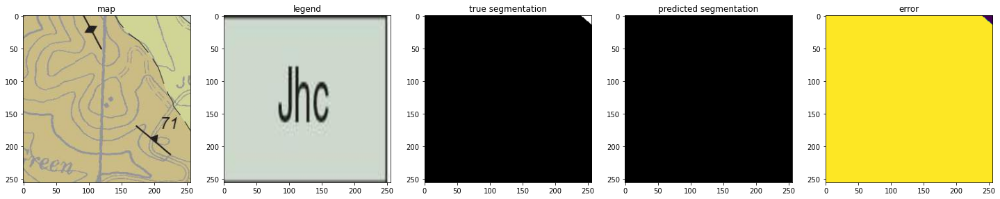

CA_SantaMaria_Kj_poly_1659.png


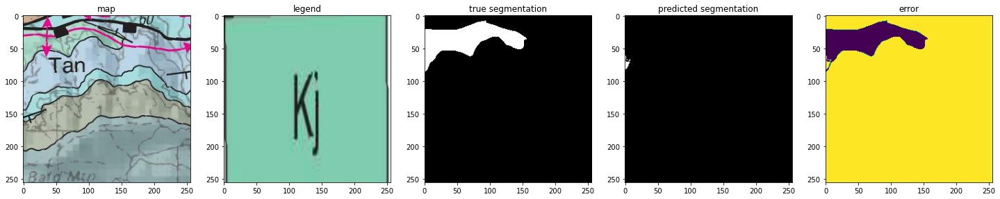

CO_FortMorgan_Qa3_poly_124.png


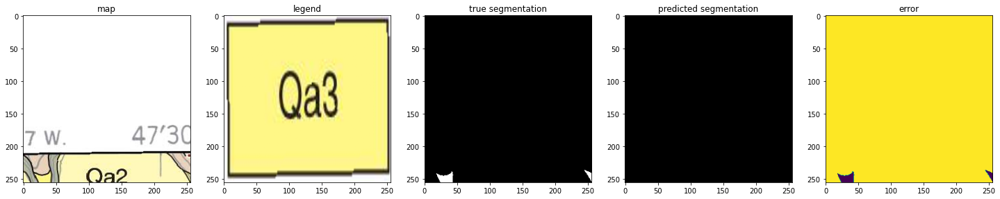

In [181]:
n=500
files = []
scores = []
for fileName in random.sample(validate_file, n):
    files.append(fileName)
    s = getMetric(fileName)
    if s[-1] < 0.1:
        print(fileName)
        plotResult(1, fileName)
    scores.append(s)
scores = np.array(scores)

In [182]:
np.median(scores[:, 2])

0.9486174896592516

(array([ 52.,   2.,   1.,   0.,   2.,   0.,   1.,   2.,   1.,   2.,   2.,
          0.,   0.,   1.,   2.,   1.,   0.,   1.,   0.,   0.,   2.,   1.,
          0.,   0.,   1.,   3.,   1.,   4.,   3.,   0.,   0.,   2.,   6.,
          1.,   5.,   4.,   5.,   4.,   5.,   8.,   9.,  16.,   6.,  12.,
         17.,  14.,  36.,  49.,  59., 157.]),
 array([0.        , 0.01999969, 0.03999939, 0.05999908, 0.07999878,
        0.09999847, 0.11999817, 0.13999786, 0.15999756, 0.17999725,
        0.19999695, 0.21999664, 0.23999634, 0.25999603, 0.27999573,
        0.29999542, 0.31999512, 0.33999481, 0.35999451, 0.3799942 ,
        0.3999939 , 0.41999359, 0.43999329, 0.45999298, 0.47999268,
        0.49999237, 0.51999207, 0.53999176, 0.55999146, 0.57999115,
        0.59999084, 0.61999054, 0.63999023, 0.65998993, 0.67998962,
        0.69998932, 0.71998901, 0.73998871, 0.7599884 , 0.7799881 ,
        0.79998779, 0.81998749, 0.83998718, 0.85998688, 0.87998657,
        0.89998627, 0.91998596, 0.93998566, 0.

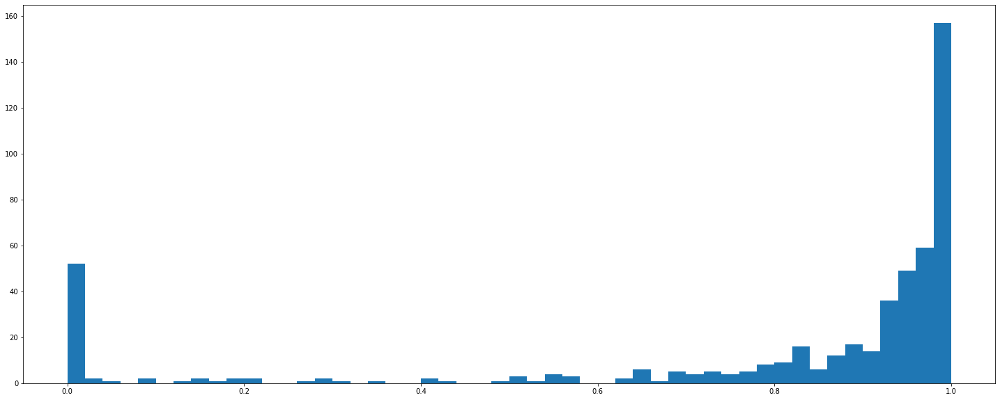

In [183]:
plt.hist(scores[:,2], bins=50)